<a href="https://colab.research.google.com/github/danielsoy/ALOCC-CVPR2018/blob/master/logitech_padim_funka.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import os
os.environ['KMP_DUPLICATE_LIB_OK']='True'
import anodet
import numpy as np
import torch
import cv2
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt

In [ ]:

DATASET_PATH = os.path.realpath   ("C:\\Users\libro/anodet\mvtec")
MODEL_DATA_PATH = os.path.realpath("C:\\anodet/notebooks\distributions")

In [ ]:
dataset = anodet.AnodetDataset(os.path.join(DATASET_PATH, "C:\\Users\libro\OneDrive\Escritorio\cropeadasOK"))
dataloader = DataLoader(dataset, batch_size=32)
print("Number of images in dataset:", len(dataloader.dataset))

Number of images in dataset: 104


In [ ]:
padim = anodet.Padim(backbone='resnet18')

In [ ]:
padim.fit(dataloader)
# tardo 600 segundos en entrenar 3800 fotos grises. 

Feature extraction: 100%|██████████| 4/4 [00:05<00:00,  1.28s/it]


In [ ]:
distributions_path = './distributions/'
torch.save(padim.mean, os.path.join(MODEL_DATA_PATH, "padimjupitermean.pt"))
torch.save(padim.cov_inv, os.path.join(MODEL_DATA_PATH, "padimjupitercovinv.pt"))

In [ ]:
images=[]
dir_path = "C:\MVTEC\hazelnut/test/todas_juntas/"

#dir_path = "C:\\Users\libro\OneDrive\Escritorio/resultadox/bien/"

#dir_path = "C:\\Users\libro\OneDrive\Escritorio/cropeadasOK/"


count = 0
# Iterate directory
for path in os.listdir(dir_path):
    # check if current path is a file
    if os.path.isfile(os.path.join(dir_path, path)):        
        count += 1

print("count : total de fotos", count)
while(count>1):        
    
    print("count", count)
    # empieza a leer por el numero mas alto entre parentesis de nombre de foto, y va bajando.
    # si cuenta mal la cantidad de foto, ya falla. porque lee un nombre de pict, que no existe
    # 
    image = cv2.imread(dir_path + str("1 ") + str("(") + str(count-1) + str(")") +".png" )
    count=count-1   
    
    #cv2.imshow("imagen", image)
    #cv2.waitKey(20)   
    
    #image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) # opencv a matplotlib azul error,no para fotos grises
    images.append(image)

count : total de fotos 111
count 111
count 110
count 109
count 108
count 107
count 106
count 105
count 104
count 103
count 102
count 101
count 100
count 99
count 98
count 97
count 96
count 95
count 94
count 93
count 92
count 91
count 90
count 89
count 88
count 87
count 86
count 85
count 84
count 83
count 82
count 81
count 80
count 79
count 78
count 77
count 76
count 75
count 74
count 73
count 72
count 71
count 70
count 69
count 68
count 67
count 66
count 65
count 64
count 63
count 62
count 61
count 60
count 59
count 58
count 57
count 56
count 55
count 54
count 53
count 52
count 51
count 50
count 49
count 48
count 47
count 46
count 45
count 44
count 43
count 42
count 41
count 40
count 39
count 38
count 37
count 36
count 35
count 34
count 33
count 32
count 31
count 30
count 29
count 28
count 27
count 26
count 25
count 24
count 23
count 22
count 21
count 20
count 19
count 18
count 17
count 16
count 15
count 14
count 13
count 12
count 11
count 10
count 9
count 8
count 7
count 6
count 5
cou

In [ ]:
mean = torch.load(os.path.join(MODEL_DATA_PATH, 'padimjupitermean.pt'))
cov_inv = torch.load(os.path.join(MODEL_DATA_PATH, 'padimjupitercovinv.pt'))

In [ ]:
padim = anodet.Padim(backbone='resnet18', mean=mean, cov_inv=cov_inv, device=torch.device('cpu'))

In [ ]:
batch = anodet.to_batch(images, anodet.standard_image_transform, torch.device('cpu'))
# si falla aca, fijarse si hay cero imagenes en dataset origen. fijarse q empiezen con: 1 (0)  1(2)

In [ ]:
image_scores, score_maps = padim.predict(batch)
# 67 seg en predecir 070 imagenes. 626 ms c/U

In [ ]:
THRESH = 12.5
total=0
score_map_classifications = anodet.classification(score_maps, THRESH)
image_classifications = anodet.classification(image_scores, THRESH)
print("Image scores:", image_scores)
print("Image classifications:", image_classifications)

test_images = np.array(images).copy()

boundary_images = anodet.visualization.framed_boundary_images(test_images, score_map_classifications, image_classifications, padding=40)
heatmap_images = anodet.visualization.heatmap_images(test_images, score_maps, alpha=0.5)
highlighted_images = anodet.visualization.highlighted_images(images, score_map_classifications, color=(128, 0, 128))
# tarda 10 segundos en inferir 110 fotos de 1024x1024, desde jupiter notebook!

 
   


Image scores: tensor([28.2207, 28.7199, 29.8455, 33.8935, 30.8714, 37.8334, 34.3232, 34.8244,
        32.3519, 34.6345, 34.3976, 31.8153, 33.1118, 30.5162, 35.1891, 42.2896,
        49.1521, 32.3727, 39.4265, 38.8361, 45.5335, 41.8765, 31.7291, 31.7291,
        42.4907, 34.8252, 31.4404, 31.4404, 33.6615, 42.0502, 34.0307, 32.7644,
        32.7644, 37.7362, 46.1261, 33.7644, 35.5429, 35.5429, 47.3201, 37.7014,
        32.6133, 37.1456, 37.1456, 43.0775, 32.0324, 34.0695, 34.3892, 34.3892,
        35.7216, 55.3704, 37.9521, 35.6019, 35.6019, 48.2186, 39.2830, 46.9436,
        43.9371, 43.9371, 47.0358, 34.1593, 42.3316, 33.7805, 33.7805, 40.6354,
        35.5740, 35.6061, 34.8557, 34.8557, 36.4275, 47.5585, 33.8037, 36.8710,
        36.8710, 48.8901, 54.6546, 48.2336, 34.0258, 34.0258, 30.1932, 31.2176,
        37.8063, 31.1860, 31.1860, 39.8705, 49.6452, 39.0960, 39.9226, 39.9226,
        44.6185, 37.3967, 39.6550, 36.4095, 36.4095, 39.1063, 34.5404, 37.2926,
        43.2180, 43.2180, 

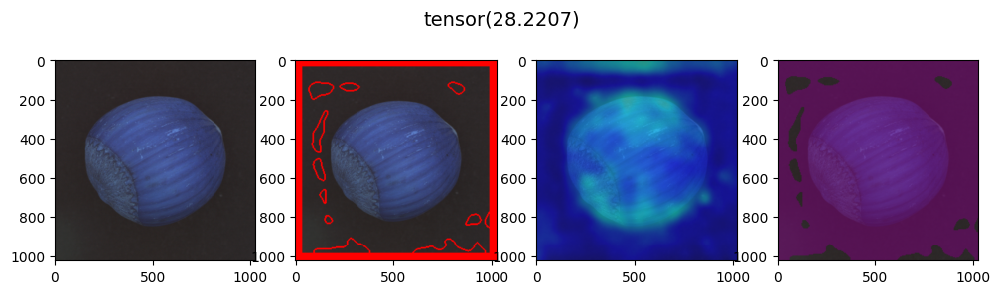

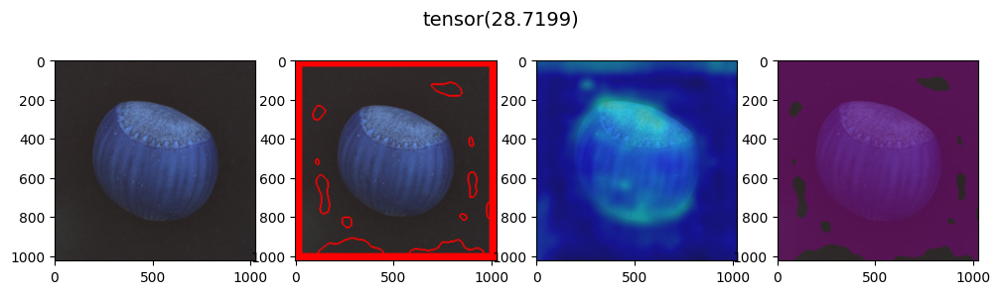

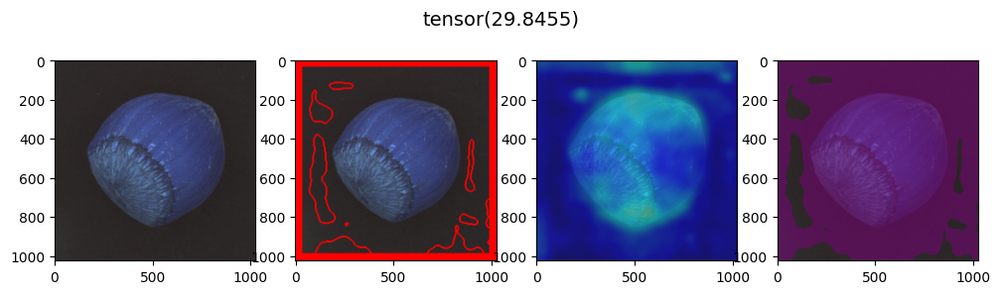

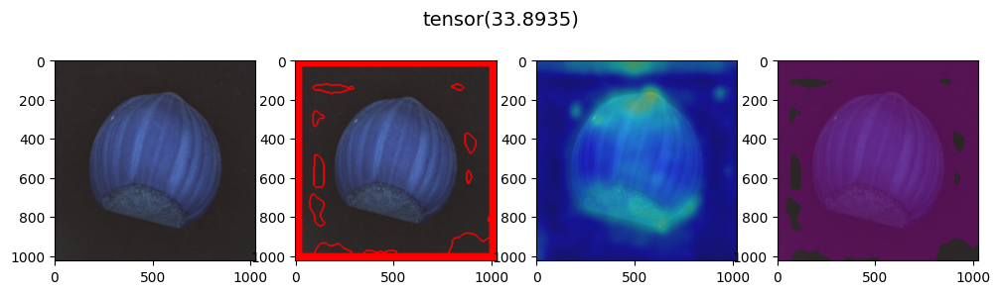

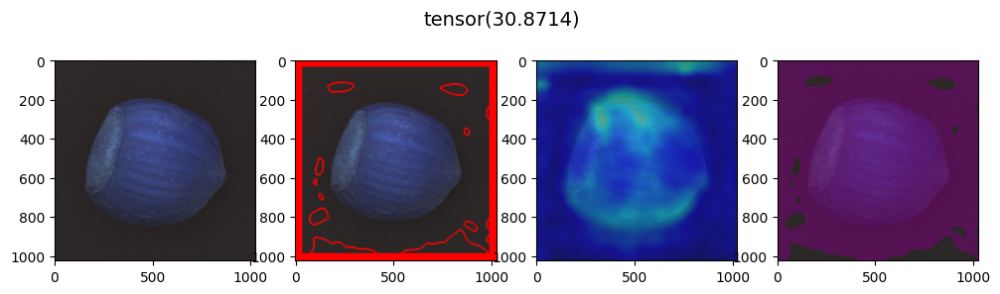

...

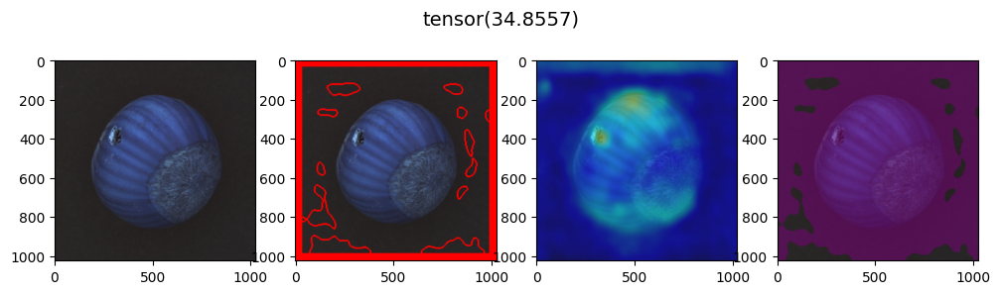

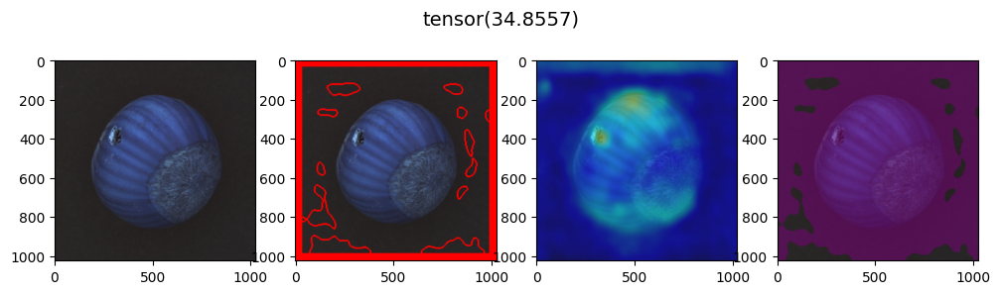

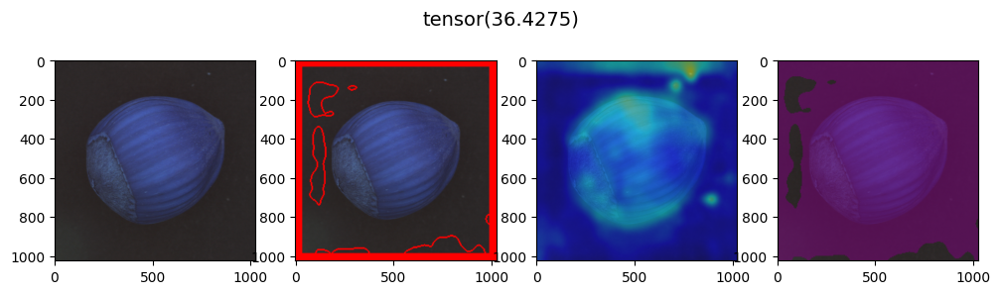

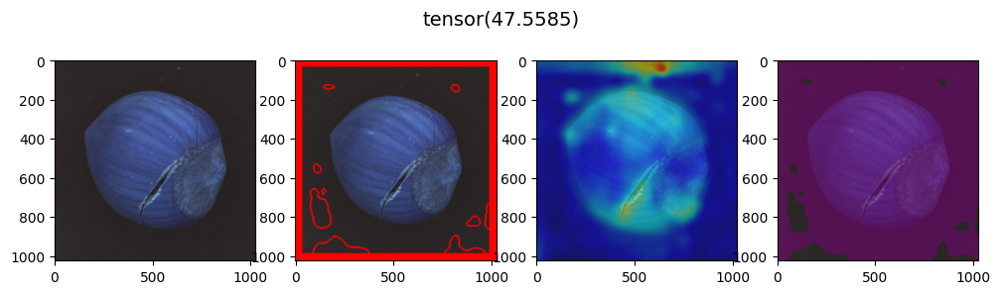

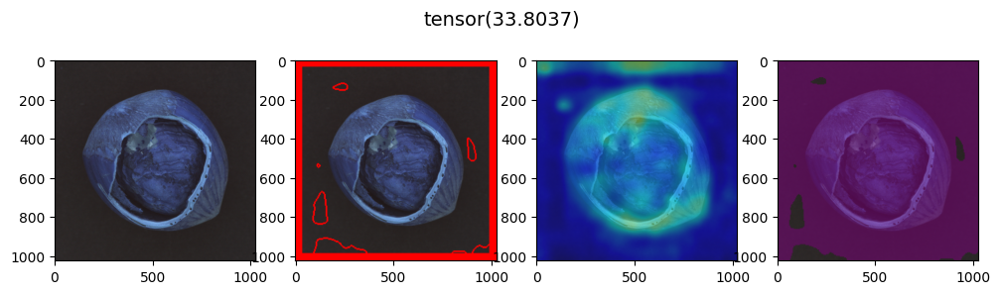

KeyboardInterrupt: 

In [ ]:
posicion=0
for idx in range(len(images)):
    fig, axs = plt.subplots(1, 4, figsize=(12, 6))
    fig.suptitle(image_scores[posicion], y=0.75 ,fontsize=14)   #.75
    posicion=posicion+1
    axs[0].imshow(images[idx])
    axs[1].imshow(boundary_images[idx])
    axs[2].imshow(heatmap_images[idx])
    axs[3].imshow(highlighted_images[idx])
    plt.show() 
     